# TWISST Analysis of *tsinfer* trees
AvePla-n74

In [21]:
library(foreach)
library(tidyverse)
library(data.table)
source('~/twisst/plot_twisst.R')
setwd('~/snap_hap_repHZ/twisst/trees_tskit/')

In [22]:
### Functions

##### ----
modify_windows = function(windows_file, scaffold, outputFile){
    windows = fread(window_file, header=TRUE)
    windows$scaffold = rep(scaffold, nrow(windows))
    windows$mid = (windows$treeStart+windows$treeEnd)/2

    colnames(windows) = c('start', 'end', 'sites', 'tree', 'scaffold', 'mid')
    windows = windows[, c('scaffold','start','end','mid','sites')]

    fwrite(windows, outputFile, quote=F, row.names=F, col.names=T)
}

##### ----
read_topo_in_windows = function(window_file, chrom, num_windows, num_trees=10000){
    
    filenames = c()
    # filename_pattern = paste0('~/snap_hap_repHZ/twisst/twisst_in_windows/Chr2.',windowID,'.*.*.weights.csv.gz')
    for (windowID in 1:num_windows){
        filename_pattern = paste0('./twisst_in_windows/', chrom, '.', windowID, '.*.*.weights.csv.gz')
        filenames = c(filenames, (Sys.glob(filename_pattern)))
    }

    ## Read all twisst topos in windows & return one dataframe
    twisst = foreach (i = 1:length(filenames), .combine=rbind) %do% {
        file = filenames[i]
        dat = fread(file)
        return(dat)
    }

    ## Read window file
    pos = fread(window_file, header=T)
    pos$scaffold = rep(chrom, nrow(pos))
    pos$mid = (pos$treeStart+pos$treeEnd)/2
    colnames(pos) = c('start','end','sites','tree','scaffold','mid')
    pos = pos[, c('scaffold','start','end','mid','sites')]
    
    ## Add coloumns and weights
    twisst = twisst %>% mutate(total = topo1 + topo2 + topo3,
                               wt1 = topo1/num_trees,
                               wt2 = topo2/num_trees,
                               wt3 = topo3/num_trees,
                               wt4 = 1-(wt1+wt2+wt3),
                               wt1_res = topo1/total,
                               wt2_res = topo2/total,
                               wt3_res = topo3/total,
                               wt4_res = 1 - (wt1_res + wt2_res + wt3_res)
                              )
    return(cbind(pos,twisst))
}

##### ----
plot_weights = function(twisst_object, fill_cols = c('red', 'blue', 'green'), mode = 'normal'){
# pos = tr6
# wt = twisst6
    dat = twisst_object
    fill_cols = fill_cols
    colsToPlot = c('wt1', 'wt2', 'wt3')
    
    x = interleave(as.matrix(dat$treeStart), as.matrix(dat$treeEnd))
    yreps = 2
    xlim = c(min(x), max(x))
    ylim = c(0,1)
    
    plot(0, pch = "", xlim = xlim, ylim = ylim, bty='n')
    
    
    if (mode == 'stacked'){
        y_stacked <- stack(as.data.frame(dat[,c('wt1','wt2','wt3')]))
        for (n in c(1:3)){
            col = colsToPlot[n]
            y_upper = rep(y_stacked[["upper"]][,n], each = yreps)
            y_lower = rep(y_stacked[["lower"]][,n], each = yreps)
            polygon(c(x,rev(x)),c(y_upper, rev(y_lower)), col = fill_cols[n], border=NA)
        }   
    } else if (mode == 'normal'){
        for (n in c(1:3)){
            col = colsToPlot[n]
            y = rep(as.data.frame(dat)[,col], each = yreps)
            polygon(c(x,rev(x)), c(y, rep(0,length(y))), col = alpha(fill_cols[n], 0.5), border=NA)
            lines(x,y, type = "l", col = alpha(fill_cols[n], 1))
        }           
    }
}

##### ----
get_windowed_weights = function(dat, size, step){
    windowed_wts = data.table()
    windowStart = seq(min(dat$start), max(dat$end), step)
    windowEnd = seq(min(dat$start)+size, max(dat$end)+size, step)
    
    # if(length(windowStart) != length(windowEnd)){
    #     cat ('ERROR')
    #     break
    # }
    
    for (i in 1:length(windowStart)){
        cat(i,"\n")
        tmpDat = dat[start>windowStart[i] & end<windowEnd[i]]
        windowMid = (windowStart[i]+windowEnd[i])/2
        wt1_win = mean(tmpDat$wt1_res)
        wt2_win = mean(tmpDat$wt2_res)
        wt3_win = mean(tmpDat$wt3_res)

        windowed_wts = rbind(windowed_wts, data.frame(windowStart[i], 
                                                      windowEnd[i], 
                                                      windowMid, 
                                                      wt1_win, 
                                                      wt2_win, 
                                                      wt3_win))
    }
    return(windowed_wts)
}

In [12]:
## modify windows files
# modify_windows('../tsinfer/newickTreeList/ts.Chr1.AvePla.all.trees.newick.txt', 'Chr1', './window_files/Chr1.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr2.AvePla.all.trees.newick.txt', 'Chr2', './window_files/Chr2.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr3.AvePla.all.trees.newick.txt', 'Chr3', './window_files/Chr3.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr4.AvePla.all.trees.newick.txt', 'Chr4', './window_files/Chr4.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr5.AvePla.all.trees.newick.txt', 'Chr5', './window_files/Chr5.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr6.AvePla.all.trees.newick.txt', 'Chr6', './window_files/Chr6.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr7.AvePla.all.trees.newick.txt', 'Chr7', './window_files/Chr7.windows.txt')
# modify_windows('../tsinfer/newickTreeList/ts.Chr8.AvePla.all.trees.newick.txt', 'Chr8', './window_files/Chr8.windows.txt')

## Read data

In [23]:
# filename_pattern = './twisst_in_windows/Chr1.*.*.*.weights.csv.gz'
# filenames = Sys.glob(filename_pattern)
# filenames
# windowID=1
# Sys.glob(paste0('./twisst_in_windows/Chr2.',windowID,'.*.*.weights.csv.gz'))

filenames = c()
for (windowID in 1:158){
    filename_pattern = paste0('./twisst_in_windows/Chr2.',windowID,'.*.*.weights.csv.gz')
    filenames = c(filenames, (Sys.glob(filename_pattern)))
}
print(filenames)

  [1] "./twisst_in_windows/Chr2.1.1.10000.weights.csv.gz"          
  [2] "./twisst_in_windows/Chr2.2.10001.20000.weights.csv.gz"      
  [3] "./twisst_in_windows/Chr2.3.20001.30000.weights.csv.gz"      
  [4] "./twisst_in_windows/Chr2.4.30001.40000.weights.csv.gz"      
  [5] "./twisst_in_windows/Chr2.5.40001.50000.weights.csv.gz"      
  [6] "./twisst_in_windows/Chr2.6.50001.60000.weights.csv.gz"      
  [7] "./twisst_in_windows/Chr2.7.60001.70000.weights.csv.gz"      
  [8] "./twisst_in_windows/Chr2.8.70001.80000.weights.csv.gz"      
  [9] "./twisst_in_windows/Chr2.9.80001.90000.weights.csv.gz"      
 [10] "./twisst_in_windows/Chr2.10.90001.100000.weights.csv.gz"    
 [11] "./twisst_in_windows/Chr2.11.100001.110000.weights.csv.gz"   
 [12] "./twisst_in_windows/Chr2.12.110001.120000.weights.csv.gz"   
 [13] "./twisst_in_windows/Chr2.13.120001.130000.weights.csv.gz"   
 [14] "./twisst_in_windows/Chr2.14.130001.140000.weights.csv.gz"   
 [15] "./twisst_in_windows/Chr2.15.140001.150000

In [24]:
## Gene annotations
gff = fread('~/snap_hap/ref_genome/v3.5/Amajus_v3.5_Chr6-52800000-53100000.gff')
str(gff)

Classes ‘data.table’ and 'data.frame':	602 obs. of  9 variables:
 $ V1: chr  "Chr6" "Chr6" "Chr6" "Chr6" ...
 $ V2: chr  "AUGUSTUS" "AUGUSTUS" "AUGUSTUS" "AUGUSTUS" ...
 $ V3: chr  "gene" "mRNA" "stop_codon" "CDS" ...
 $ V4: int  52806363 52806363 52806363 52806363 52806363 52806786 52807571 52807571 52807571 52807571 ...
 $ V5: int  52806788 52806788 52806365 52806788 52806788 52806788 52815366 52815366 52807573 52807585 ...
 $ V6: chr  "0.8" "0.8" "." "0.8" ...
 $ V7: chr  "-" "-" "-" "-" ...
 $ V8: chr  "." "." "0" "0" ...
 $ V9: chr  "ID=AnM01G33519;Accession=GWHGBJVT033502;Alias=g35130;;transl_table=1" "ID=AnM01G33519.01;Accession=GWHTBJVT035566;Parent=AnM01G33519;Parent_Accession=GWHGBJVT033502;Alias=g35130.t1;;transl_table=1" "ID=g35130.t1.stop1;Parent=AnM01G33519.01;;transl_table=1" "ID=g35130.t1.CDS1;Parent=AnM01G33519.01;Parent_Accession=GWHTBJVT035566;Protein_Accession=GWHPBJVT035566;;transl_table=1" ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [26]:
num_trees = 10000

# Chr1
chrom = 'Chr6'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr1.AvePla.FrYe.newick.tsv.gz'
twisst1 = read_topo_in_windows(window_file, 'Chr1', 141, num_trees)
cat('\nChr1:', nrow(twisst1))

# Chr2
chrom = 'Chr2'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr2.AvePla.FrYe.newick.tsv.gz'
twisst2 = read_topo_in_windows(window_file, 'Chr2', 158, num_trees)
cat('\nChr2:', nrow(twisst2))

## Chr3
chrom = 'Chr3'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr3.AvePla.FrYe.newick.tsv.gz'
twisst3 = read_topo_in_windows(window_file, 'Chr3', 125, num_trees)
cat('\nChr3:', nrow(twisst3))

# Chr4
chrom = 'Chr4'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr4.AvePla.FrYe.newick.tsv.gz'
twisst4 = read_topo_in_windows(window_file, 'Chr4', 105, num_trees)
cat('\nChr4:', nrow(twisst4))

# Chr5
chrom = 'Chr5'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr5.AvePla.FrYe.newick.tsv.gz'
twisst5 = read_topo_in_windows(window_file, 'Chr5', 149, num_trees)
cat('\nChr5:', nrow(twisst5))

# Chr6
chrom = 'Chr6'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr6.AvePla.FrYe.newick.tsv.gz'
twisst6 = read_topo_in_windows(window_file, 'Chr6', 111, num_trees)
cat('\nChr6:', nrow(twisst6))

# Chr7
chrom = 'Chr7'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr7.AvePla.FrYe.newick.tsv.gz'
twisst7 = read_topo_in_windows(window_file, 'Chr7', 106, num_trees)
cat('\nChr7:', nrow(twisst7))

# Chr8
chrom = 'Chr8'
window_file = '~/snap_hap_repHZ/tsinfer/newickTreeList/tsD.Chr8.AvePla.FrYe.newick.tsv.gz'
twisst8 = read_topo_in_windows(window_file, 'Chr8', 122, num_trees)
cat('\nChr8:', nrow(twisst8))


Chr1: 1403765
Chr2: 1573167
Chr3: 1248690
Chr4: 1047391
Chr5: 1487197
Chr6: 1107574
Chr7: 1054034
Chr8: 1213612

In [29]:
str(twisst1)

Classes ‘data.table’ and 'data.frame':	1403765 obs. of  17 variables:
 $ scaffold: chr  "Chr1" "Chr1" "Chr1" "Chr1" ...
 $ start   : num  4912 4985 4997 5018 5270 ...
 $ end     : num  4985 4997 5018 5270 5274 ...
 $ mid     : num  4948 4991 5008 5144 5272 ...
 $ sites   : num  73 12 21 252 4 32 349 369 17 6 ...
 $ topo1   : int  2549 2591 2527 2714 2680 2735 2981 2742 2688 3139 ...
 $ topo2   : int  2478 2504 2518 2707 2704 2885 2925 3512 3340 2987 ...
 $ topo3   : int  2422 2375 2433 2518 2569 2625 2720 2682 2674 2977 ...
 $ total   : int  7449 7470 7478 7939 7953 8245 8626 8936 8702 9103 ...
 $ wt1     : num  0.255 0.259 0.253 0.271 0.268 ...
 $ wt2     : num  0.248 0.25 0.252 0.271 0.27 ...
 $ wt3     : num  0.242 0.237 0.243 0.252 0.257 ...
 $ wt4     : num  0.255 0.253 0.252 0.206 0.205 ...
 $ wt1_res : num  0.342 0.347 0.338 0.342 0.337 ...
 $ wt2_res : num  0.333 0.335 0.337 0.341 0.34 ...
 $ wt3_res : num  0.325 0.318 0.325 0.317 0.323 ...
 $ wt4_res : num  0 0 0 0 0 0 0 0 0 0

In [ ]:
fwrite(twisst1, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst1.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst2, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst2.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst3, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst3.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst4, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst4.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst5, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst5.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst6, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst6.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst7, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst7.csv.gz", row.names=F, col.names=T, sep=',', quote=F)
fwrite(twisst8, file="~/snap_hap_repHZ/twisst/trees_tskit/twisst_weights_combined/twisst8.csv.gz", row.names=F, col.names=T, sep=',', quote=F)

In [34]:
size=10000
step=5000
# RosEl_wins = get_windowed_weights(twisst6[1000000:1050000,], size, step)

twisst1_wins = get_windowed_weights(twisst1, size, step)
twisst2_wins = get_windowed_weights(twisst2, size, step)
twisst3_wins = get_windowed_weights(twisst3, size, step)
twisst4_wins = get_windowed_weights(twisst4, size, step)
twisst5_wins = get_windowed_weights(twisst5, size, step)
twisst6_wins = get_windowed_weights(twisst6, size, step)
twisst7_wins = get_windowed_weights(twisst7, size, step)
twisst8_wins = get_windowed_weights(twisst8, size, step)

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 
52 
53 
54 
55 
56 
57 
58 
59 
60 
61 
62 
63 
64 
65 
66 
67 
68 
69 
70 
71 
72 
73 
74 
75 
76 
77 
78 
79 
80 
81 
82 
83 
84 
85 
86 
87 
88 
89 
90 
91 
92 
93 
94 
95 
96 
97 
98 
99 
100 
101 
102 
103 
104 
105 
106 
107 
108 
109 
110 
111 
112 
113 
114 
115 
116 
117 
118 
119 
120 
121 
122 
123 
124 
125 
126 
127 
128 
129 
130 
131 
132 
133 
134 
135 
136 
137 
138 
139 
140 
141 
142 
143 
144 
145 
146 
147 
148 
149 
150 
151 
152 
153 
154 
155 
156 
157 
158 
159 
160 
161 
162 
163 
164 
165 
166 
167 
168 
169 
170 
171 
172 
173 
174 
175 
176 
177 
178 
179 
180 
181 
182 
183 
184 
185 
186 
187 
188 
189 
190 
191 
192 
193 
194 
195 
196 
197 
198 
199 
200 
201 
202 
203 
204 
205 
206 
207 
208 
209 
210 
211 
212 
213 
214 
215 
216 
217 
218 
219 
220 
221 
222

In [65]:
size=100000
step=100000
# RosEl_wins = get_windowed_weights(twisst6[1000000:1050000,], size, step)

twisst1_wins2 = get_windowed_weights(twisst1, size, step)
twisst2_wins2 = get_windowed_weights(twisst2, size, step)
twisst3_wins2 = get_windowed_weights(twisst3, size, step)
twisst4_wins2 = get_windowed_weights(twisst4, size, step)
twisst5_wins2 = get_windowed_weights(twisst5, size, step)
twisst6_wins2 = get_windowed_weights(twisst6, size, step)
twisst7_wins2 = get_windowed_weights(twisst7, size, step)
twisst8_wins2 = get_windowed_weights(twisst8, size, step)

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 
52 
53 
54 
55 
56 
57 
58 
59 
60 
61 
62 
63 
64 
65 
66 
67 
68 
69 
70 
71 
72 
73 
74 
75 
76 
77 
78 
79 
80 
81 
82 
83 
84 
85 
86 
87 
88 
89 
90 
91 
92 
93 
94 
95 
96 
97 
98 
99 
100 
101 
102 
103 
104 
105 
106 
107 
108 
109 
110 
111 
112 
113 
114 
115 
116 
117 
118 
119 
120 
121 
122 
123 
124 
125 
126 
127 
128 
129 
130 
131 
132 
133 
134 
135 
136 
137 
138 
139 
140 
141 
142 
143 
144 
145 
146 
147 
148 
149 
150 
151 
152 
153 
154 
155 
156 
157 
158 
159 
160 
161 
162 
163 
164 
165 
166 
167 
168 
169 
170 
171 
172 
173 
174 
175 
176 
177 
178 
179 
180 
181 
182 
183 
184 
185 
186 
187 
188 
189 
190 
191 
192 
193 
194 
195 
196 
197 
198 
199 
200 
201 
202 
203 
204 
205 
206 
207 
208 
209 
210 
211 
212 
213 
214 
215 
216 
217 
218 
219 
220 
221 
222

In [ ]:
str()

In [16]:
dat = twisst6[1:20, ]
size = 10000
step = 1000

dat6 = get_windowed_weights(dat, size, step)

12345

In [37]:
print(dat6)

   windowStart.i. windowEnd.i. windowMid   wt1_win   wt2_win   wt3_win
            <num>        <num>     <num>     <num>     <num>     <num>
1:          11407        21407     16407 0.3192285 0.3759231 0.3048484
2:          12407        22407     17407 0.3219236 0.3719284 0.3061480
3:          13407        23407     18407 0.3430665 0.3451543 0.3117792
4:          14407        24407     19407 0.3537836 0.3384405 0.3077759
5:          15407        25407     20407 0.3735425 0.3241689 0.3022886


In [26]:
dat = twisst6[1:20, ]  
# windowed_weights = data.table()
# dat$windowID = 
size = 1000
step = 100
windowed_wts = data.table()
windowStart = seq(min(dat$start), max(dat$end), step)
windowEnd = seq(min(dat$start)+size, max(dat$end)+size, step)

tmpDat = dat[start>windowStart[1] & end<windowEnd[1]]
windowMid = (windowStart[1]+windowEnd[1])/2
wt1_win = mean(tmpDat$wt1_res)
wt2_win = mean(tmpDat$wt2_res)
wt3_win = mean(tmpDat$wt3_res)

windowed_weights = rbind(windowed_weights,
                            data.frame(windowStart[1], windowEnd[1], windowMid, wt1_win, wt2_win, wt3_win))

print(windowed_weights)

   windowStart.1. windowEnd.1. windowMid   wt1_win   wt2_win   wt3_win
            <num>        <num>     <num>     <num>     <num>     <num>
1:          11407        12407     11907 0.3028668 0.3998905 0.2972427
2:          11407        12407     11907 0.3028668 0.3998905 0.2972427


In [14]:
## Chr2
filenames = c()
for (windowID in 1:158){
    filename_pattern = paste0('./twisst_in_windows/Chr2.',windowID,'.*.*.weights.csv.gz')
    filenames = c(filenames, (Sys.glob(filename_pattern)))
}
print(filenames)

  [1] "./twisst_in_windows/Chr2.1.1.10000.weights.csv.gz"          
  [2] "./twisst_in_windows/Chr2.2.10001.20000.weights.csv.gz"      
  [3] "./twisst_in_windows/Chr2.3.20001.30000.weights.csv.gz"      
  [4] "./twisst_in_windows/Chr2.4.30001.40000.weights.csv.gz"      
  [5] "./twisst_in_windows/Chr2.5.40001.50000.weights.csv.gz"      
  [6] "./twisst_in_windows/Chr2.6.50001.60000.weights.csv.gz"      
  [7] "./twisst_in_windows/Chr2.7.60001.70000.weights.csv.gz"      
  [8] "./twisst_in_windows/Chr2.8.70001.80000.weights.csv.gz"      
  [9] "./twisst_in_windows/Chr2.9.80001.90000.weights.csv.gz"      
 [10] "./twisst_in_windows/Chr2.10.90001.100000.weights.csv.gz"    
 [11] "./twisst_in_windows/Chr2.11.100001.110000.weights.csv.gz"   
 [12] "./twisst_in_windows/Chr2.12.110001.120000.weights.csv.gz"   
 [13] "./twisst_in_windows/Chr2.13.120001.130000.weights.csv.gz"   
 [14] "./twisst_in_windows/Chr2.14.130001.140000.weights.csv.gz"   
 [15] "./twisst_in_windows/Chr2.15.140001.150000

In [16]:
simple.loess.predict <- function(x, y, span, new_x=NULL, weights = NULL, max = NULL, min = NULL, family=NULL){
    y.loess <- loess(y ~ x, span = span, weights = weights, family=family)
    if (is.null(new_x)) {y.predict <- predict(y.loess,x)}
    else {y.predict <- predict(y.loess,new_x)}
    if (is.null(min) == FALSE) {y.predict = ifelse(y.predict > min, y.predict, min)}
    if (is.null(max) == FALSE) {y.predict = ifelse(y.predict < max, y.predict, max)}
    y.predict
    }

smooth.df <- function(x, df, span, new_x = NULL, col.names=NULL, weights=NULL, min=NULL, max=NULL, family=NULL){
    if (is.null(new_x)) {smoothed <- df}
    else smoothed = df[1:length(new_x),]
    if (is.null(col.names)){col.names=colnames(df)}
    for (col.name in col.names){
        print(paste("smoothing",col.name))
        smoothed[,col.name] <- simple.loess.predict(x,df[,col.name],span = span, new_x = new_x, max = max, min = min, weights = weights, family=family)
        }
    smoothed
    }

smooth.weights <- function(window_positions, weights_dataframe, span, new_positions=NULL, window_sites=NULL){
    weights_smooth <- smooth.df(x=window_positions,df=weights_dataframe,
                                span=span, new_x=new_positions, min=0, max=1, weights=window_sites)

    #return rescaled to sum to 1
    weights_smooth / apply(weights_smooth, 1, sum)
    }

## Chr6

In [ ]:
    dat = twisst_object
    fill_cols = fill_cols
    colsToPlot = c('wt1', 'wt2', 'wt3')
    
    x = interleave(as.matrix(dat$treeStart), as.matrix(dat$treeEnd))
    yreps = 2
    xlim = c(min(x), max(x))
    ylim = c(0,1)
    
    plot(0, pch = "", xlim = xlim, ylim = ylim, bty='n')
    
    
    if (mode == 'stacked'){
        y_stacked <- stack(as.data.frame(dat[,c('wt1','wt2','wt3')]))
        for (n in c(1:3)){
            col = colsToPlot[n]
            y_upper = rep(y_stacked[["upper"]][,n], each = yreps)
            y_lower = rep(y_stacked[["lower"]][,n], each = yreps)
            polygon(c(x,rev(x)),c(y_upper, rev(y_lower)), col = fill_cols[n], border=NA)
        }   
    } else if (mode == 'normal'){
        for (n in c(1:3)){
            col = colsToPlot[n]
            y = rep(as.data.frame(dat)[,col], each = yreps)
            polygon(c(x,rev(x)), c(y, rep(0,length(y))), col = alpha(fill_cols[n], 0.5), border=NA)
            lines(x,y, type = "l", col = alpha(fill_cols[n], 1))
        }           
    }


In [1]:
str(twisst6)

ERROR: Error in eval(expr, envir, enclos): object 'twisst6' not found


In [20]:
size=10000
step=1000
# RosEl_wins = get_windowed_weights(twisst6[1000000:1050000,], size, step)
twisst6_wins = get_windowed_weights(twisst6, size, step)

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 
52 
53 
54 
55 
56 
57 
58 
59 
60 
61 
62 
63 
64 
65 
66 
67 
68 
69 
70 
71 
72 
73 
74 
75 
76 
77 
78 
79 
80 
81 
82 
83 
84 
85 
86 
87 
88 
89 
90 
91 
92 
93 
94 
95 
96 
97 
98 
99 
100 
101 
102 
103 
104 
105 
106 
107 
108 
109 
110 
111 
112 
113 
114 
115 
116 
117 
118 
119 
120 
121 
122 
123 
124 
125 
126 
127 
128 
129 
130 
131 
132 
133 
134 
135 
136 
137 
138 
139 
140 
141 
142 
143 
144 
145 
146 
147 
148 
149 
150 
151 
152 
153 
154 
155 
156 
157 
158 
159 
160 
161 
162 
163 
164 
165 
166 
167 
168 
169 
170 
171 
172 
173 
174 
175 
176 
177 
178 
179 
180 
181 
182 
183 
184 
185 
186 
187 
188 
189 
190 
191 
192 
193 
194 
195 
196 
197 
198 
199 
200 
201 
202 
203 
204 
205 
206 
207 
208 
209 
210 
211 
212 
213 
214 
215 
216 
217 
218 
219 
220 
221 
222

In [28]:
size=100000
step=10000
# RosEl_wins = get_windowed_weights(twisst6[1000000:1050000,], size, step)
twisst6_wins2 = get_windowed_weights(twisst6, size, step)

1 
2 
3 
4 
5 
6 
7 
8 
9 
10 
11 
12 
13 
14 
15 
16 
17 
18 
19 
20 
21 
22 
23 
24 
25 
26 
27 
28 
29 
30 
31 
32 
33 
34 
35 
36 
37 
38 
39 
40 
41 
42 
43 
44 
45 
46 
47 
48 
49 
50 
51 
52 
53 
54 
55 
56 
57 
58 
59 
60 
61 
62 
63 
64 
65 
66 
67 
68 
69 
70 
71 
72 
73 
74 
75 
76 
77 
78 
79 
80 
81 
82 
83 
84 
85 
86 
87 
88 
89 
90 
91 
92 
93 
94 
95 
96 
97 
98 
99 
100 
101 
102 
103 
104 
105 
106 
107 
108 
109 
110 
111 
112 
113 
114 
115 
116 
117 
118 
119 
120 
121 
122 
123 
124 
125 
126 
127 
128 
129 
130 
131 
132 
133 
134 
135 
136 
137 
138 
139 
140 
141 
142 
143 
144 
145 
146 
147 
148 
149 
150 
151 
152 
153 
154 
155 
156 
157 
158 
159 
160 
161 
162 
163 
164 
165 
166 
167 
168 
169 
170 
171 
172 
173 
174 
175 
176 
177 
178 
179 
180 
181 
182 
183 
184 
185 
186 
187 
188 
189 
190 
191 
192 
193 
194 
195 
196 
197 
198 
199 
200 
201 
202 
203 
204 
205 
206 
207 
208 
209 
210 
211 
212 
213 
214 
215 
216 
217 
218 
219 
220 
221 
222

In [6]:
str(RosEl_wins)

Classes ‘data.table’ and 'data.frame':	1695 obs. of  6 variables:
 $ windowStart.i.: num  51782276 51783276 51784276 51785276 51786276 ...
 $ windowEnd.i.  : num  51792276 51793276 51794276 51795276 51796276 ...
 $ windowMid     : num  51787276 51788276 51789276 51790276 51791276 ...
 $ wt1_win       : num  0.37 0.37 0.368 0.366 0.366 ...
 $ wt2_win       : num  0.32 0.321 0.319 0.326 0.328 ...
 $ wt3_win       : num  0.31 0.309 0.313 0.308 0.307 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [21]:
str(twisst6_wins)

Classes ‘data.table’ and 'data.frame':	55684 obs. of  6 variables:
 $ windowStart.i.: num  11407 12407 13407 14407 15407 ...
 $ windowEnd.i.  : num  21407 22407 23407 24407 25407 ...
 $ windowMid     : num  16407 17407 18407 19407 20407 ...
 $ wt1_win       : num  0.337 0.338 0.342 0.343 0.343 ...
 $ wt2_win       : num  0.349 0.345 0.339 0.338 0.337 ...
 $ wt3_win       : num  0.314 0.317 0.32 0.32 0.32 ...
 - attr(*, ".internal.selfref")=<externalptr> 


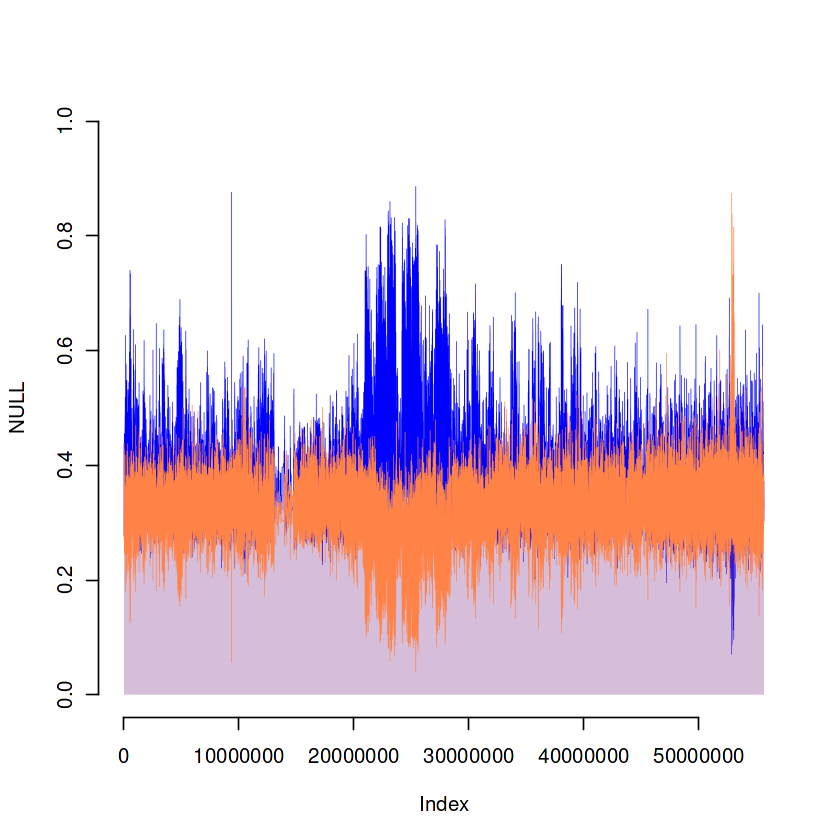

In [19]:
dat = twisst6
colsToPlot = c('wt1_res', 'wt2_res')
colorsToPlot = c('blue', 'sienna1')

xVals = interleave(as.matrix(dat$treeStart), as.matrix(dat$treeEnd))
yreps = 2
xlim = c(min(xVals), max(xVals))
ylim = c(0,1)

plot(NULL, pch = "", xlim = xlim, ylim = ylim, bty='n')

for(colID in 1:length(colsToPlot)){
    colName = colsToPlot[colID]
    yVals = rep(as.data.frame(dat)[,colName], each = yreps)
    polygon(x = c(xVals, rev(xVals)), y = c(yVals, rep(0,length(yVals))), col = alpha(colorsToPlot[colID], 0.2), border = NA)
    lines(yVals~xVals, dat, type='s', col=colorsToPlot[colID], lwd=0.4)
}

In [20]:
pdf('./twisst6.pdf', width=20, height=5)
dat = twisst6
colsToPlot = c('wt1_res', 'wt2_res')
colorsToPlot = c('blue', 'sienna1')

xVals = interleave(as.matrix(dat$treeStart), as.matrix(dat$treeEnd))
yreps = 2
xlim = c(min(xVals), max(xVals))
ylim = c(0,1)

plot(NULL, pch = "", xlim = xlim, ylim = ylim, bty='n')

for (colID in 1:length(colsToPlot)){
    colName = colsToPlot[colID]
    yVals = rep(as.data.frame(dat)[,colName], each = yreps)
    polygon(x = c(xVals, rev(xVals)), y = c(yVals, rep(0,length(yVals))), col = alpha(colorsToPlot[colID], 0.2), border = NA)
    lines(yVals~xVals, dat, type='s', col=colorsToPlot[colID], lwd=0.4)
}
dev.off()

png 
  2

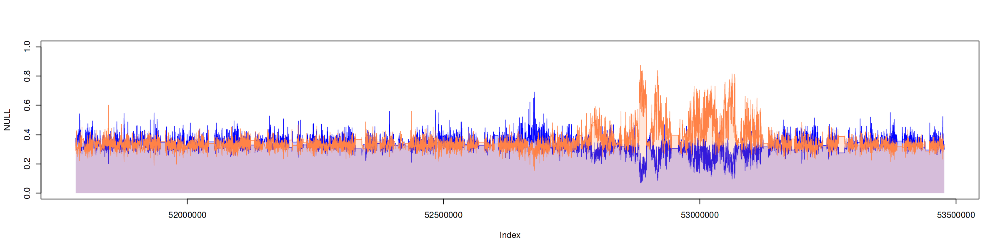

In [12]:
options(repr.plot.width=20, repr.plot.height=5)
dat = twisst6[1000000:1050000,]
colsToPlot = c('wt1_res', 'wt2_res')
colorsToPlot = c('blue', 'sienna1')

xVals = interleave(as.matrix(dat$treeStart), as.matrix(dat$treeEnd))
yreps = 2
xlim = c(min(xVals), max(xVals))
ylim = c(0,1)

plot(NULL, pch = "", xlim = xlim, ylim = ylim)

# ggplot(dat) +
#     geom_step(aes(wt1_res))

for (colID in 1:length(colsToPlot)){
    colName = colsToPlot[colID]
    yVals = rep(as.data.frame(dat)[,colName], each = yreps)
    polygon(x = c(xVals, rev(xVals)), y = c(yVals, rep(0,length(yVals))), col = alpha(colorsToPlot[colID], 0.2), border = NA)
    lines(yVals~xVals, dat, type='s', col=colorsToPlot[colID], lwd=0.8)
}

In [24]:
window = fread('././window_files/Chr6.windows.txt')
datObj = list()
datObj$window_data$Chr6 = window
datObj$weights_raw$Chr6 = dat[,9:11]
datObj$weights$Chr6 = dat[,13:15]
datObj$n_regions = 1
datObj$lengths$Chr6 = max(window$end)
datObj$pos$Chr6 = (window$mid)

In [ ]:
smooth.twisst <- function(twisst_object, span=0.05, span_bp=NULL, spacing=NULL) {
    l=list()
    
    l$topos <- twisst_object$topos
    
    l$n_regions <- twisst_object$n_regions
    
    l$weights <- list()
    
    l$lengths = twisst_object$lengths

    l$pos <- list()
    
    for (i in 1:l$n_regions){
        if (is.null(span_bp) == FALSE) span <- span_bp/twisst_object$length[[i]]
        
        if (is.null(spacing) == TRUE) spacing <- twisst_object$length[[i]]*span*.1
        
        l$pos[[i]] <- seq(twisst_object$pos[[i]][1], tail(twisst_object$pos[[i]],1), spacing)
        
        l$weights[[i]] <- smooth.weights(twisst_object$pos[[i]], twisst_object$weights[[i]], new_x <- l$pos[[i]], span = span,
                                         window_sites=twisst_object$window_data$sites[[i]])
        }
    l
    }

In [ ]:
smooth.weights(datObj$pos, dat[,13:15], new_x <- l$pos[[i]], span = span,
                                         window_sites=twisst_object$window_data$sites[[i]])

In [25]:
twisst_data_smooth <- smooth.twisst(datObj$pos, dat[,13:15], spacing = 1000)

[1] "smoothing wt1_res"


ERROR: Error: j (the 2nd argument inside [...]) is a single symbol but column name 'col.name' is not found. If you intended to select columns using a variable in calling scope, please try DT[, ..col.name]. The .. prefix conveys one-level-up similar to a file system path.


In [13]:
    windowStart = seq(min(twisst6$start), max(twisst6$end), step)
    windowEnd = seq(min(twisst6$start)+size, max(twisst6$end)+size, step)
length(windowStart)

[1] 55684

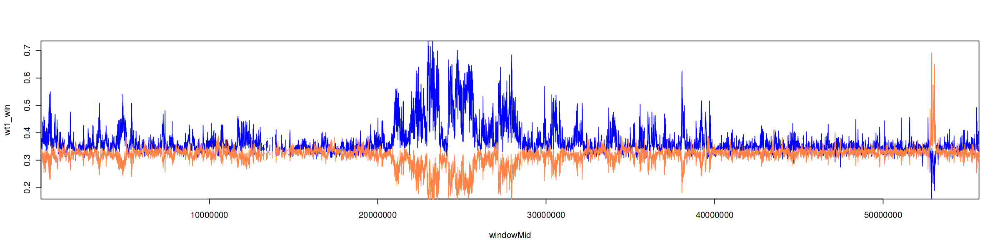

In [30]:
## Chr6
par(xaxs='i', yaxs='i')
plot(wt1_win~windowMid, twisst6_wins, type='l', col='blue')
lines(wt2_win~windowMid, twisst6_wins, col='sienna1')

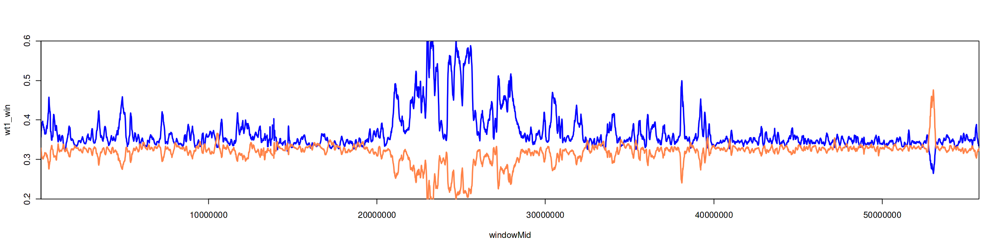

In [32]:
## Chr6
par(xaxs='i', yaxs='i')
plot(wt1_win~windowMid, twisst6_wins2, type='l', col='blue', ylim=c(0.2,0.6), lwd=2)
lines(wt2_win~windowMid, twisst6_wins2, col='sienna1', ylim=c(0,0.8), lwd=2)

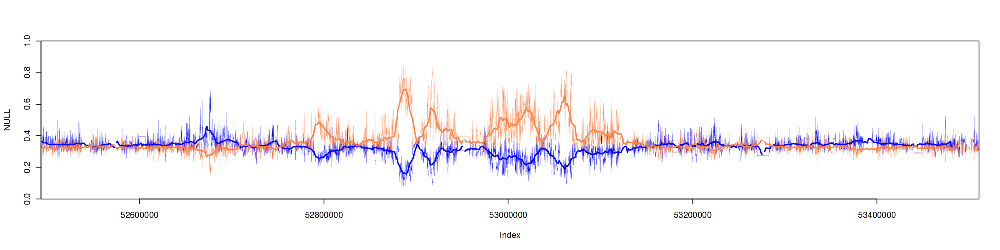

In [24]:
options(repr.plot.width=20, repr.plot.height=5)

par(xaxs='i', yaxs='i')
dat = twisst6[1021400:1051000,]
colsToPlot = c('wt1_res', 'wt2_res')
colorsToPlot = c('blue', 'sienna1')

xVals = interleave(as.matrix(dat$start), as.matrix(dat$end))
yreps = 2
xlim = c(min(xVals), max(xVals))
ylim = c(0,1)

plot(NULL, pch = "", xlim = xlim, ylim = ylim)

for (colID in 1:length(colsToPlot)){
    colName = colsToPlot[colID]
    yVals = rep(as.data.frame(dat)[,colName], each = yreps)
    # polygon(x = c(xVals, rev(xVals)), y = c(yVals, rep(0,length(yVals))), col = alpha(colorsToPlot[colID], 0.7), border = NA)
    lines(yVals~xVals, dat, type='s', col=colorsToPlot[colID], lwd=0.2)
}
lines(RosEl_wins$windowMid, RosEl_wins$wt1_win, col='blue', lwd=2)
lines(RosEl_wins$windowMid, RosEl_wins$wt2_win, col='sienna1', lwd=2)

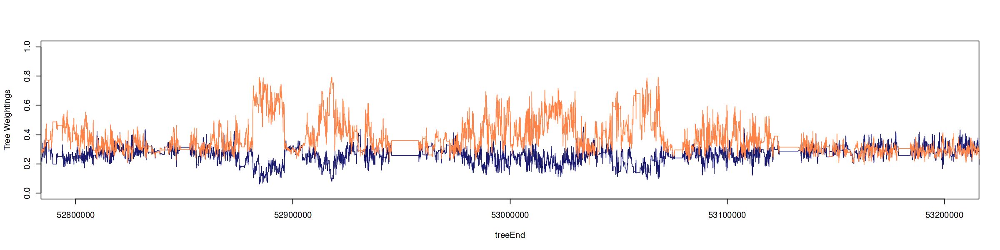

In [13]:
options(repr.plot.width=20, repr.plot.height=5)

plot(wt1~treeEnd, twisst6[1021400:1051000,], type='s', col='midnightblue', xlim=c(52800000,53200000), ylim=c(0,1), ylab='Tree Weightings')
lines(wt2~treeEnd, twisst6[1021400:1051000,], type='s', col='sienna1', xlim=c(52800000,53200000), ylim=c(0,1))
# lines(-wt3~treeEnd, twisst6[1021400:1051000,], type='l', xlim=c(52800000,53200000), ylim=c(-1,1), col='lightgrey')

# abline(h=0)
# abline(h=c(-0.33,0.33), lty=2, col='red')

# for (geneID in 1:nrow(gff[V3 == 'gene'])){
#     gene = gff[V3 == 'gene'][geneID,]
#     # cat(geneID, gene$V4, gene$V5, '\n')
#     ylim=ifelse(gene$V7 == '+', -0.85, -0.95)
#     segments(x0=gene$V4, x1=gene$V5, y0=ylim, y1=ylim, lwd=1)
# }
# for (exonID in 1:nrow(gff[V3 == 'exon'])){
#     exon = gff[V3 == 'exon'][exonID,]
#     # ylim=ifelse(exon$V7 == '+', c(-0.9,-0.8), c(-1,-0.9))
#     if(exon$V7 == '+') {
#         ylim=c(-0.9,-0.8)
#     } else {
#         ylim=c(-1,-0.9)
#     }
#     rect(xleft=exon$V4, xright=exon$V5, ybottom=ylim[1], ytop=ylim[2], lwd=1, col='black')
# }

## misc

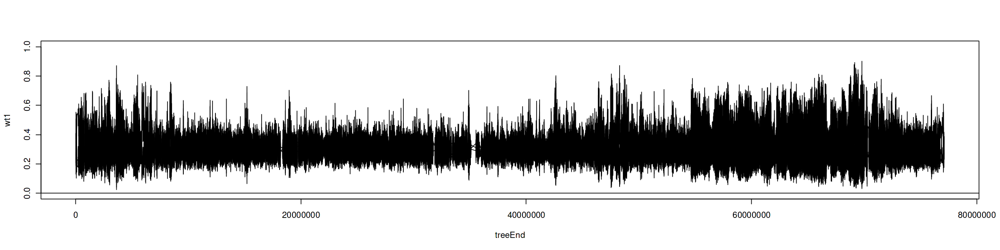

In [135]:
options(repr.plot.width=20, repr.plot.height=5)
ylim=c(0,1)
plot(wt1~treeEnd, twisst2, bty=NULL, ylim=ylim, type='l')
lines((wt2)~treeEnd, twisst2, bty=NULL, ylim=ylim)
lines((wt3)~treeEnd, twisst2, bty=NULL, ylim=ylim)
abline(h=0)

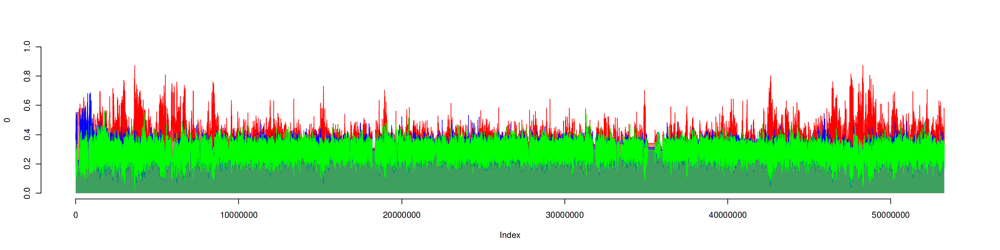

In [179]:
# options()
plot_weights(twisst2[1:1000000,], mode='normal')

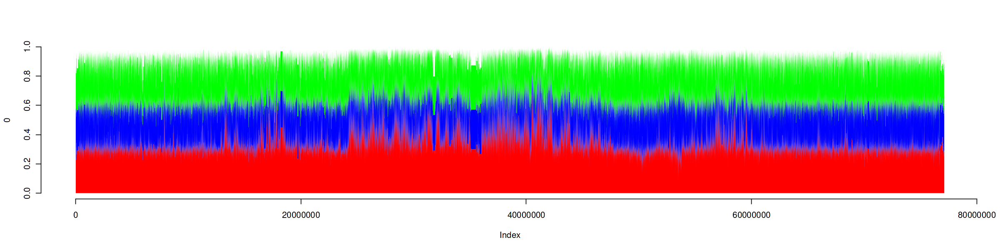

In [6]:
options(repr.plot.width=20, repr.plot.height=5)
plot_weights(twisst2, mode='stacked')

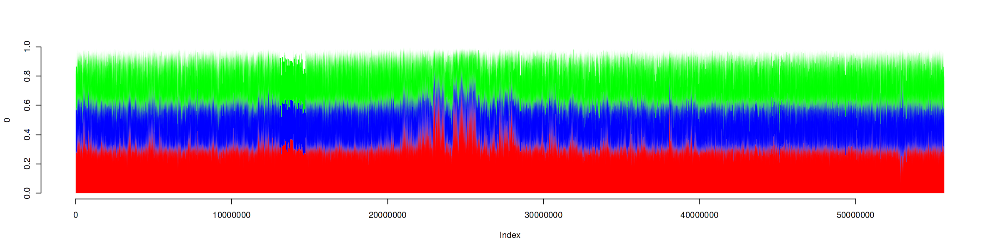

In [7]:
options(repr.plot.width=20, repr.plot.height=5)
plot_weights(twisst6, mode='stacked')

In [ ]:
plot_weights(twisst2, mode='normal')

In [10]:
str(twisst6)

Classes ‘data.table’ and 'data.frame':	1107574 obs. of  12 variables:
 $ treeStart: num  11407 11563 11577 11638 12892 ...
 $ treeEnd  : num  11563 11577 11638 12892 12919 ...
 $ treeSpan : num  156 14 61 1254 27 ...
 $ tree     : chr  "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ ...
 $ topo1    : int  2550 2490 2388 2543 2562 2330 2267 2261 2274 2395 ...
 $ topo2    : int  3376 3399 3385 3316 3359 3624 3532 3513 3402 3174 ...
 $ topo3    : int  2404 2491 2487 2485 2460 2292 2376 2331 2454 2570 ...
 $ total    : int  8330 8

In [29]:
which(twisst6$treeStart > 52500000 & twisst6$treeEnd < 53500000)

[1] 1021546 1021547 1021548 1021549 1021550 1021551 1021552 1021553 1021554
   [10] 1021555 1021556 1021557 1021558 1021559 1021560 1021561 1021562 1021563
   [19] 1021564 1021565 1021566 1021567 1021568 1021569 1021570 1021571 1021572
   [28] 1021573 1021574 1021575 1021576 1021577 1021578 1021579 1021580 1021581
   [37] 1021582 1021583 1021584 1021585 1021586 1021587 1021588 1021589 1021590
   [46] 1021591 1021592 1021593 1021594 1021595 1021596 1021597 1021598 1021599
   [55] 1021600 1021601 1021602 1021603 1021604 1021605 1021606 1021607 1021608
   [64] 1021609 1021610 1021611 1021612 1021613 1021614 1021615 1021616 1021617
   [73] 1021618 1021619 1021620 1021621 1021622 1021623 1021624 1021625 1021626
   [82] 1021627 1021628 1021629 1021630 1021631 1021632 1021633 1021634 1021635
   [91] 1021636 1021637 1021638 1021639 1021640 1021641 1021642 1021643 1021644
  [100] 1021645 1021646 1021647 1021648 1021649 1021650 1021651 1021652 1021653
  [109] 1021654 1021655 1021656 1021657 1021658 1021659 1021660 1021661 1021662
  [118] 1021663 1021664 1021665 1021666 1021667 1021668 1021669 1021670 1021671
  [127] 1021672 1021673 1021674 1021675 1021676 1021677 1021678 1021679 1021680
  [136] 1021681 1021682 1021683 1021684 1021685 1021686 1021687 1021688 1021689
  [145] 1021690 1021691 1021692 1021693 1021694 1021695 1021696 1021697 1021698
  [154] 1021699 1021700 1021701 1021702 1021703 1021704 1021705 1021706 1021707
  [163] 1021708 1021709 1021710 1021711 1021712 1021713 1021714 1021715 1021716
  [172] 1021717 1021718 1021719 1021720 1021721 1021722 1021723 1021724 1021725
  [181] 1021726 1021727 1021728 1021729 1021730 1021731 1021732 1021733 1021734
  [190] 1021735 1021736 1021737 1021738 1021739 1021740 1021741 1021742 1021743
  [199] 1021744 1021745 1021746 1021747 1021748 1021749 1021750 1021751 1021752
  [208] 1021753 1021754 1021755 1021756 1021757 1021758 1021759 1021760 1021761
  [217] 1021762 1021763 1021764 1021765 1021766 1021767 1021768 1021769 1021770
  [226] 1021771 1021772 1021773 1021774 1021775 1021776 1021777 1021778 1021779
  [235] 1021780 1021781 1021782 1021783 1021784 1021785 1021786 1021787 1021788
  [244] 1021789 1021790 1021791 1021792 1021793 1021794 1021795 1021796 1021797
  [253] 1021798 1021799 1021800 1021801 1021802 1021803 1021804 1021805 1021806
  [262] 1021807 1021808 1021809 1021810 1021811 1021812 1021813 1021814 1021815
  [271] 1021816 1021817 1021818 1021819 1021820 1021821 1021822 1021823 1021824
  [280] 1021825 1021826 1021827 1021828 1021829 1021830 1021831 1021832 1021833
  [289] 1021834 1021835 1021836 1021837 1021838 1021839 1021840 1021841 1021842
  [298] 1021843 1021844 1021845 1021846 1021847 1021848 1021849 1021850 1021851
  [307] 1021852 1021853 1021854 1021855 1021856 1021857 1021858 1021859 1021860
  [316] 1021861 1021862 1021863 1021864 1021865 1021866 1021867 1021868 1021869
  [325] 1021870 1021871 1021872 1021873 1021874 1021875 1021876 1021877 1021878
  [334] 1021879 1021880 1021881 1021882 1021883 1021884 1021885 1021886 1021887
  [343] 1021888 1021889 1021890 1021891 1021892 1021893 1021894 1021895 1021896
  [352] 1021897 1021898 1021899 1021900 1021901 1021902 1021903 1021904 1021905
  [361] 1021906 1021907 1021908 1021909 1021910 1021911 1021912 1021913 1021914
  [370] 1021915 1021916 1021917 1021918 1021919 1021920 1021921 1021922 1021923
  [379] 1021924 1021925 1021926 1021927 1021928 1021929 1021930 1021931 1021932
  [388] 1021933 1021934 1021935 1021936 1021937 1021938 1021939 1021940 1021941
  [397] 1021942 1021943 1021944 1021945 1021946 1021947 1021948 1021949 1021950
  [406] 1021951 1021952 1021953 1021954 1021955 1021956 1021957 1021958 1021959
  [415] 1021960 1021961 1021962 1021963 1021964 1021965 1021966 1021967 1021968
  [424] 1021969 1021970 1021971 1021972 1021973 1021974 1021975 1021976 1021977
  [433] 1021978 1021979 1021980 1021981 1021982 1021983 1021984 1021985 1021986
  [442] 1021987 1021988 1021989 1021990 1021991 1021992 1021993 1021994 1021995
  [4

In [63]:
gff[,1:8]

V1,V2,V3,V4,V5,V6,V7,V8
<chr>,<chr>,<chr>,<int>,<int>,<chr>,<chr>,<chr>
Chr6,AUGUSTUS,gene,52806363,52806788,0.8,-,.
Chr6,AUGUSTUS,mRNA,52806363,52806788,0.8,-,.
Chr6,AUGUSTUS,stop_codon,52806363,52806365,.,-,0
Chr6,AUGUSTUS,CDS,52806363,52806788,0.8,-,0
Chr6,AUGUSTUS,exon,52806363,52806788,.,-,.
Chr6,AUGUSTUS,start_codon,52806786,52806788,.,-,0
Chr6,AUGUSTUS,gene,52807571,52815366,0.37,+,.
Chr6,AUGUSTUS,mRNA,52807571,52815366,0.37,+,.
Chr6,AUGUSTUS,start_codon,52807571,52807573,.,+,0


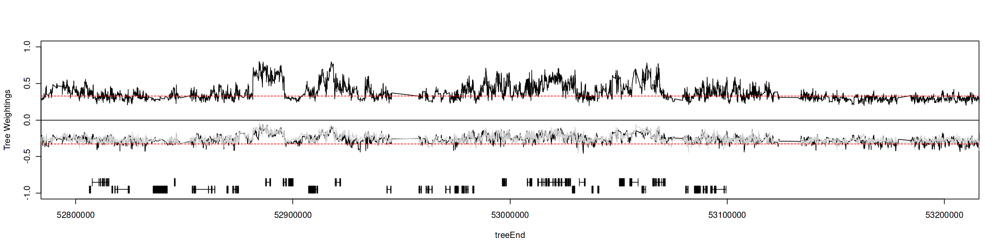

In [72]:
## Chr6
options(repr.plot.width=20, repr.plot.height=5)
plot(wt2~treeEnd, twisst6[1021400:1051000,], type='l', xlim=c(52800000,53200000), ylim=c(-1,1), ylab='Tree Weightings')
lines(-wt1~treeEnd, twisst6[1021400:1051000,], type='l', xlim=c(52800000,53200000), ylim=c(-1,1))
lines(-wt3~treeEnd, twisst6[1021400:1051000,], type='l', xlim=c(52800000,53200000), ylim=c(-1,1), col='lightgrey')
abline(h=0)
abline(h=c(-0.33,0.33), lty=2, col='red')

for (geneID in 1:nrow(gff[V3 == 'gene'])){
    gene = gff[V3 == 'gene'][geneID,]
    # cat(geneID, gene$V4, gene$V5, '\n')
    ylim=ifelse(gene$V7 == '+', -0.85, -0.95)
    segments(x0=gene$V4, x1=gene$V5, y0=ylim, y1=ylim, lwd=1)
}
for (exonID in 1:nrow(gff[V3 == 'exon'])){
    exon = gff[V3 == 'exon'][exonID,]
    # ylim=ifelse(exon$V7 == '+', c(-0.9,-0.8), c(-1,-0.9))
    if(exon$V7 == '+') {
        ylim=c(-0.9,-0.8)
    } else {
        ylim=c(-1,-0.9)
    }
    rect(xleft=exon$V4, xright=exon$V5, ybottom=ylim[1], ytop=ylim[2], lwd=1, col='black')
}

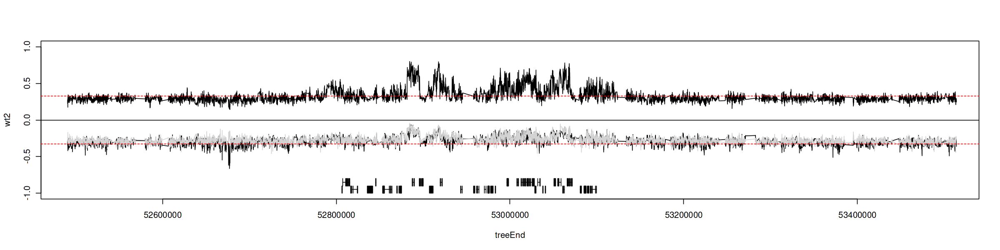

In [71]:
## Chr6
options(repr.plot.width=20, repr.plot.height=5)
plot(wt2~treeEnd, twisst6[1021200:1051200,], type='l', xlim=c(52500000,53500000), ylim=c(-1,1), ylab='Tree Weightings')
lines(-wt1~treeEnd, twisst6[1021200:1051200,], type='l', xlim=c(52500000,53500000), ylim=c(-1,1))
lines(-wt3~treeEnd, twisst6[1021200:1051200,], type='l', xlim=c(52500000,53500000), ylim=c(-1,1), col='lightgrey')
abline(h=0)
abline(h=c(-0.33,0.33), lty=2, col='red')

for (geneID in 1:nrow(gff[V3 == 'gene'])){
    gene = gff[V3 == 'gene'][geneID,]
    # cat(geneID, gene$V4, gene$V5, '\n')
    ylim=ifelse(gene$V7 == '+', -0.85, -0.95)
    segments(x0=gene$V4, x1=gene$V5, y0=ylim, y1=ylim, lwd=1)
}
for (exonID in 1:nrow(gff[V3 == 'exon'])){
    exon = gff[V3 == 'exon'][exonID,]
    # ylim=ifelse(exon$V7 == '+', c(-0.9,-0.8), c(-1,-0.9))
    if(exon$V7 == '+') {
        ylim=c(-0.9,-0.8)
    } else {
        ylim=c(-1,-0.9)
    }
    rect(xleft=exon$V4, xright=exon$V5, ybottom=ylim[1], ytop=ylim[2], lwd=1, col='black')
}

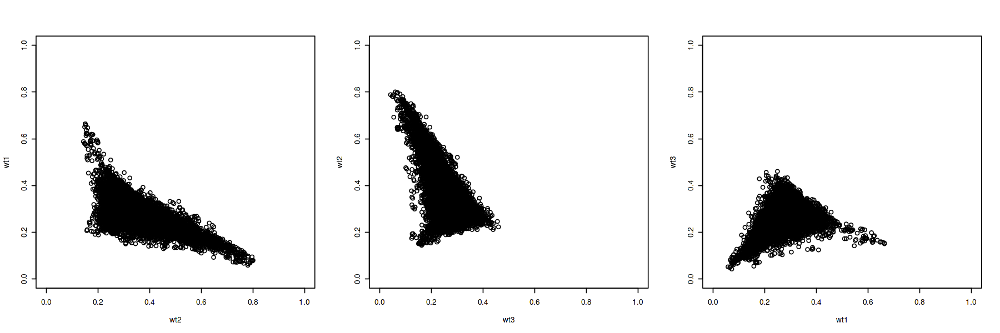

In [42]:
options(repr.plot.width=15, repr.plot.height=5)
# dat = twisst6[1021400:1051000,c('wt1','wt2','wt3')]
# plot(dat)
par(mfrow=c(1,3))
plot(wt1~wt2,twisst6[1021400:1051000,], xlim=c(0,1), ylim=c(0,1))
plot(wt2~wt3,twisst6[1021400:1051000,], xlim=c(0,1), ylim=c(0,1))
plot(wt3~wt1,twisst6[1021400:1051000,], xlim=c(0,1), ylim=c(0,1))

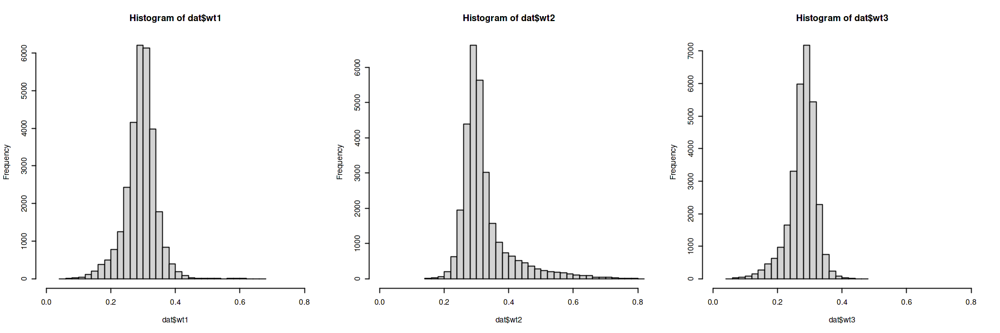

In [50]:
options(repr.plot.width=15, repr.plot.height=5)
dat = twisst6[1021400:1051000,c('wt1','wt2','wt3')]
# plot(dat)
par(mfrow=c(1,3))
hist(dat$wt1, xlim=c(0,0.8), breaks=40)
hist(dat$wt2, xlim=c(0,0.8), breaks=40)
hist(dat$wt3, xlim=c(0,0.8), breaks=20)

In [10]:
## Chr6
filename_pattern = './twisst_in_windows/Chr6.*.*.*.weights.csv.gz'
filenames = Sys.glob(filename_pattern)
twisst6 = foreach (i = 1:length(filenames), .combine=rbind) %do% {
    file = filenames[i]
    dat = fread(file)
    return(dat)
}

In [18]:
str(twisst6)

Classes ‘data.table’ and 'data.frame':	1107574 obs. of  6 variables:
 $ topo1: int  2863 2882 2916 2879 2847 2967 2555 2553 2528 2804 ...
 $ topo2: int  3136 3101 3302 3400 3195 3074 2864 2873 3003 2933 ...
 $ topo3: int  3094 3099 2938 2931 3031 2859 2546 2558 2439 2711 ...
 $ wt1  : num  0.315 0.317 0.318 0.313 0.314 ...
 $ wt2  : num  0.345 0.341 0.361 0.369 0.352 ...
 $ wt3  : num  0.34 0.341 0.321 0.318 0.334 ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [16]:
tr6 = fread('../tsinfer/newickTreeList/ts.Chr6.AvePla.all.trees.newick.txt', header=T)

In [17]:
str(tr6)

Classes ‘data.table’ and 'data.frame':	1107574 obs. of  4 variables:
 $ treeStart: num  11407 11563 11577 11638 12892 ...
 $ treeEnd  : num  11563 11577 11638 12892 12919 ...
 $ treeSpan : num  156 14 61 1254 27 ...
 $ tree     : chr  "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ ...
 - attr(*, ".internal.selfref")=<externalptr> 


In [106]:
nrow(twisst6)
twisst6 = twisst6 %>% mutate(total = twisst6$topo1+twisst6$topo2+twisst6$topo3,
                             wt1 = twisst6$topo1/10000,
                            wt2 = twisst6$topo2/10000,
                            wt3 = twisst6$topo3/10000,
                            wt4 = 1-(wt1+wt2+wt3))

[1] 1107574

In [9]:
str(twisst6)

Classes ‘data.table’ and 'data.frame':	1107574 obs. of  12 variables:
 $ treeStart: num  11407 11563 11577 11638 12892 ...
 $ treeEnd  : num  11563 11577 11638 12892 12919 ...
 $ treeSpan : num  156 14 61 1254 27 ...
 $ tree     : chr  "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ "(n38:1.00004627915586819,n133:1.00004627915586819,(n16:0.02027027027027027,n69:0.02027027027027027):0.979776008"| __truncated__ ...
 $ topo1    : int  2550 2490 2388 2543 2562 2330 2267 2261 2274 2395 ...
 $ topo2    : int  3376 3399 3385 3316 3359 3624 3532 3513 3402 3174 ...
 $ topo3    : int  2404 2491 2487 2485 2460 2292 2376 2331 2454 2570 ...
 $ total    : int  8330 8

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   3527    8638    9032    8929    9337    9985 

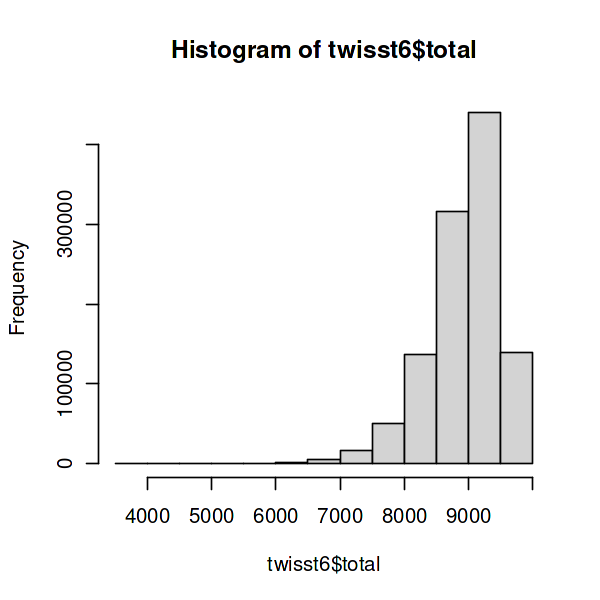

In [105]:
options(repr.plot.width=5, repr.plot.height=5)
summary(twisst6$total)
hist(twisst6$total)

In [35]:
pos = tr6[treeStart>52000000 & treeStart<54000000, 1:3]
nrow(pos)

[1] 58428

In [36]:
# which(tr6$treeStart>52000000 & tr6$treeStart<54000000)
wt = twisst6[1006480:1064907,]
nrow(wt)

[1] 58428

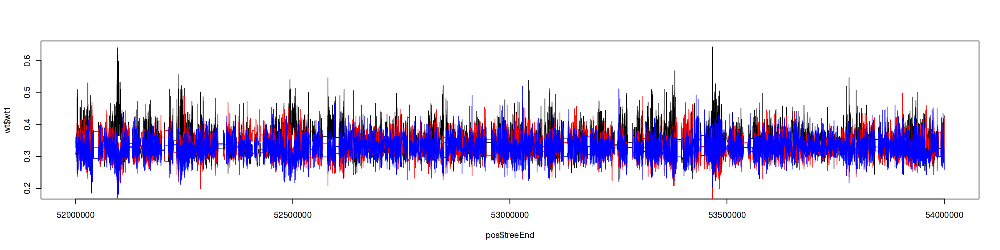

In [37]:
options(repr.plot.width=20, repr.plot.height=5)
plot(pos$treeEnd, wt$wt1, type='s')
lines(pos$treeEnd, wt$wt2, type='s', col='red')
lines(pos$treeEnd, wt$wt3, type='s', col='blue')

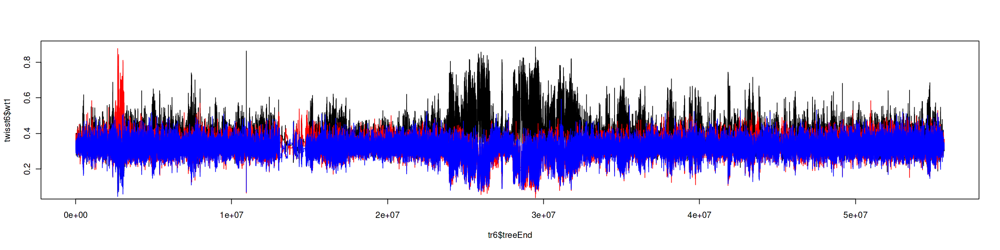

In [24]:
options(repr.plot.width=20, repr.plot.height=5)
plot(tr6$treeEnd, twisst6$wt1, type='s')
lines(tr6$treeEnd, twisst6$wt2, type='s', col='red')
lines(tr6$treeEnd, twisst6$wt3, type='s', col='blue')

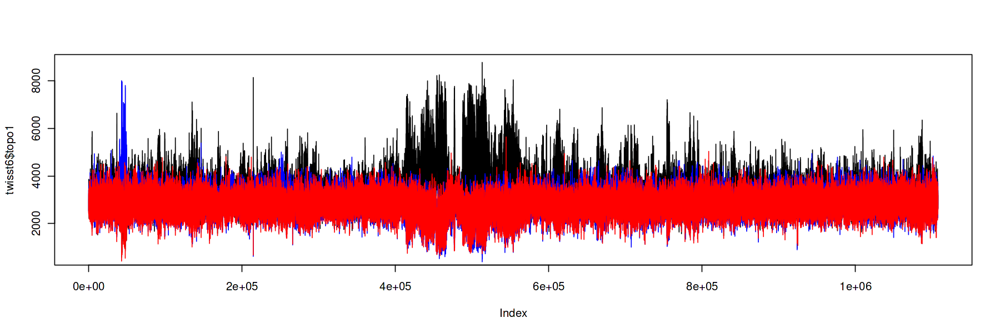

In [13]:
options(repr.plot.width=15, repr.plot.height=5)
plot(twisst6$topo1, type='l')
lines(twisst6$topo2, col='blue')
lines(twisst6$topo3, col='red')

In [69]:
pos = pos[1:100]
wt = wt[1:100]

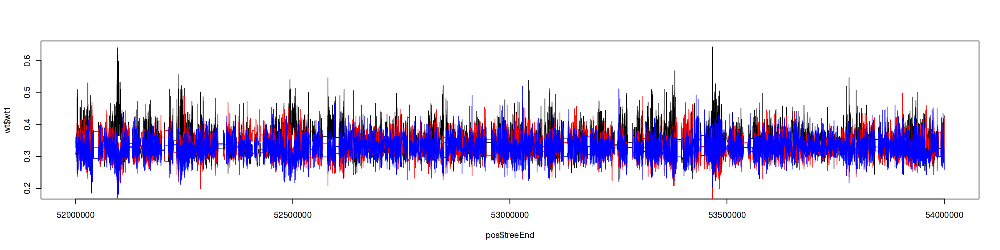

In [89]:
options(repr.plot.width=20, repr.plot.height=5)
plot(pos$treeEnd, wt$wt1, type='s')
lines(pos$treeEnd, wt$wt2, type='s', col='red')
lines(pos$treeEnd, wt$wt3, type='s', col='blue')

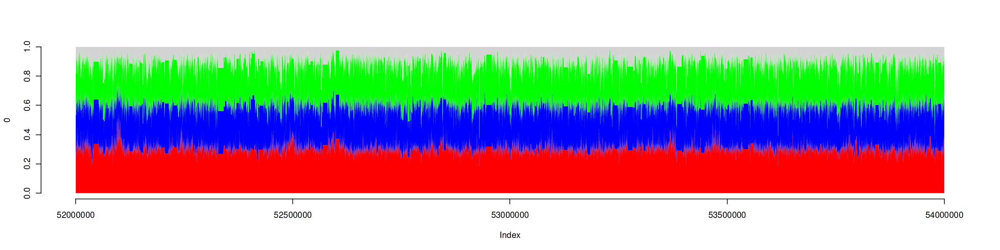

In [113]:
options(repr.plot.width=20, repr.plot.height=5)

pos = tr6[treeStart>52000000 & treeStart<54000000, 1:3]
wt = twisst6[1006480:1064907,]
# pos = tr6[1:1000, 1:3]
# wt = twisst6[1:1000,]

x = interleave(as.matrix(pos[,1]), as.matrix(pos[,2]))
yreps = 2
xlim = c(min(x), max(x))
ylim=c(0,1)
plot(0, pch = "", xlim = xlim, ylim = ylim, bty='n')
fill_cols = c('red', 'blue', 'green', 'lightgrey')
y_stacked <- stack(as.data.frame(wt[,c(4:6,8)]))
# y_stacked
for (n in c(1:4)){
    y_upper = rep(y_stacked[["upper"]][,n], each = yreps)
    y_lower = rep(y_stacked[["lower"]][,n], each = yreps)
    polygon(c(x,rev(x)),c(y_upper, rev(y_lower)), col = fill_cols[n], border=NA)
    }

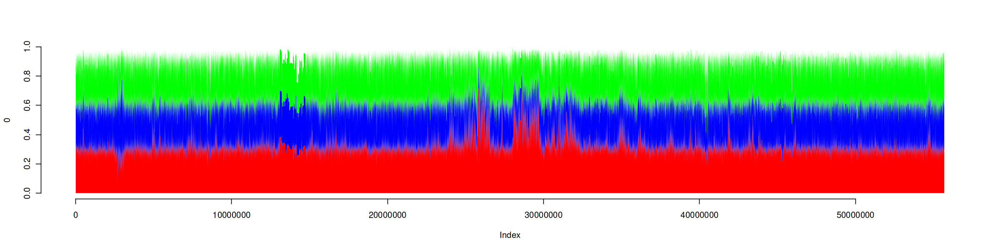

In [114]:
options(repr.plot.width=20, repr.plot.height=5)
pos = tr6
wt = twisst6

x = interleave(as.matrix(pos[,1]), as.matrix(pos[,2]))
yreps = 2
xlim = c(min(x), max(x))
ylim=c(0,1)
plot(0, pch = "", xlim = xlim, ylim = ylim, bty='n')
fill_cols = c('red', 'blue', 'green')
y_stacked <- stack(as.data.frame(wt[,4:6]))
# y_stacked
for (n in c(1:3)){
    y_upper = rep(y_stacked[["upper"]][,n], each = yreps)
    y_lower = rep(y_stacked[["lower"]][,n], each = yreps)
    polygon(c(x,rev(x)),c(y_upper, rev(y_lower)), col = fill_cols[n], border=NA)
    }

for (n in 1:ncol(weights_dataframe)){
            y = rep(weights_dataframe[,n],each=yreps)
            polygon(c(x,rev(x)),c(y, rep(0,length(y))), col=fill_cols[n], border=NA,density=density[n])
            lines(x,y, type = "l", col = line_cols[n],lwd=lwd)
            }
        }

In [86]:
fill_cols = c('red', 'blue', 'green')
y_stacked <- stack(as.data.frame(wt[,4:6]))
# y_stacked
for (n in c(1:3)){
    y_upper = rep(y_stacked[["upper"]][,n], each = yreps)
    y_lower = rep(y_stacked[["lower"]][,n], each = yreps)
    polygon(c(x,rev(x)),c(y_upper, rev(y_lower)), col = fill_cols[n], border=NA)
    }

ERROR: Error in eval(expr, envir, enclos): object 'x' not found


In [85]:
fill_c

[1] 0.6527693 0.6527693 0.6498239 0.6498239 0.6532736 0.6532736 0.6723328
  [8] 0.6723328 0.6679296 0.6679296 0.6634572 0.6634572 0.6390936 0.6390936
 [15] 0.6391160 0.6391160 0.6335954 0.6335954 0.6664848 0.6664848 0.6853359
 [22] 0.6853359 0.6852830 0.6852830 0.6678899 0.6678899 0.6703571 0.6703571
 [29] 0.6693843 0.6693843 0.6814783 0.6814783 0.6909640 0.6909640 0.6927246
 [36] 0.6927246 0.7003268 0.7003268 0.7039918 0.7039918 0.7027272 0.7027272
 [43] 0.6871801 0.6871801 0.6853783 0.6853783 0.6816059 0.6816059 0.6677807
 [50] 0.6677807 0.6880195 0.6880195 0.6635244 0.6635244 0.6816475 0.6816475
 [57] 0.6664526 0.6664526 0.6887565 0.6887565 0.6930048 0.6930048 0.6796910
 [64] 0.6796910 0.6865840 0.6865840 0.6843612 0.6843612 0.6880436 0.6880436
 [71] 0.6947590 0.6947590 0.6742309 0.6742309 0.6599447 0.6599447 0.6365174
 [78] 0.6365174 0.6547768 0.6547768 0.6668188 0.6668188 0.6770172 0.6770172
 [85] 0.7343418 0.7343418 0.7182019 0.7182019 0.7277045 0.7277045 0.7440214
 [92] 0.7440214 0.7218906 0.7218906 0.6909387 0.6909387 0.7143642 0.7143642
 [99] 0.7125612 0.7125612 0.7245053 0.7245053 0.7155570 0.7155570 0.7190414
[106] 0.7190414 0.7297035 0.7297035 0.7405625 0.7405625 0.7410165 0.7410165
[113] 0.7475718 0.7475718 0.7431252 0.7431252 0.7379032 0.7379032 0.7363243
[120] 0.7363243 0.7411348 0.7411348 0.7400861 0.7400861 0.7506154 0.7506154
[127] 0.7196303 0.7196303 0.7088318 0.7088318 0.7172636 0.7172636 0.7111704
[134] 0.7111704 0.7143654 0.7143654 0.7215747 0.7215747 0.7166019 0.7166019
[141] 0.6905602 0.6905602 0.7045609 0.7045609 0.6669616 0.6669616 0.6576616
[148] 0.6576616 0.6793578 0.6793578 0.6644164 0.6644164 0.6656707 0.6656707
[155] 0.6728182 0.6728182 0.6933575 0.6933575 0.6790386 0.6790386 0.6779390
[162] 0.6779390 0.6843009 0.6843009 0.6666308 0.6666308 0.6834532 0.6834532
[169] 0.6782044 0.6782044 0.6733500 0.6733500 0.6694638 0.6694638 0.6659438
[176] 0.6659438 0.6733491 0.6733491 0.6832689 0.6832689 0.6653509 0.6653509
[183] 0.6730155 0.6730155 0.6770582 0.6770582 0.6920857 0.6920857 0.6624125
[190] 0.6624125 0.6715703 0.6715703 0.6714938 0.6714938 0.6801235 0.6801235
[197] 0.6677109 0.6677109 0.6813772 0.6813772

In [72]:
a=data.frame(A=1:5, B=11:15, C=21:25)
print(a)

  A  B  C
1 1 11 21
2 2 12 22
3 3 13 23
4 4 14 24
5 5 15 25


In [73]:
print(stack(a))

$upper
     A  B  C
[1,] 1 12 33
[2,] 2 14 36
[3,] 3 16 39
[4,] 4 18 42
[5,] 5 20 45

$lower
  A B  C
1 0 1 12
2 0 2 14
3 0 3 16
4 0 4 18
5 0 5 20



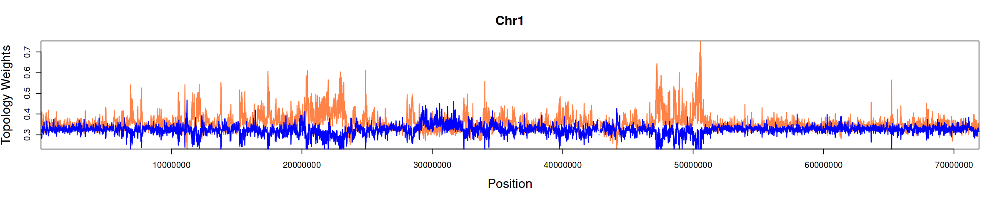

In [77]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr1
plot(wt1_win~windowMid, twisst1_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr1',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst1_wins, col='blue', lwd=1.5)

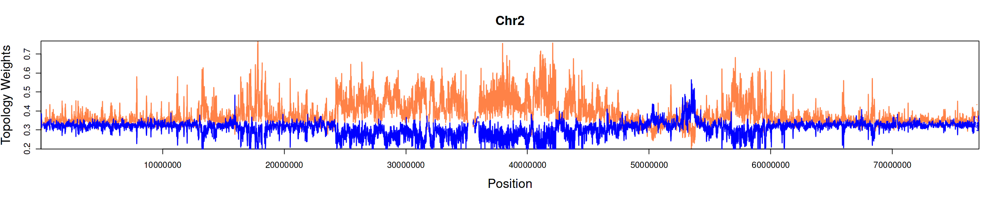

In [78]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr2
plot(wt1_win~windowMid, twisst2_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr2',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst2_wins, col='blue', lwd=1.5)

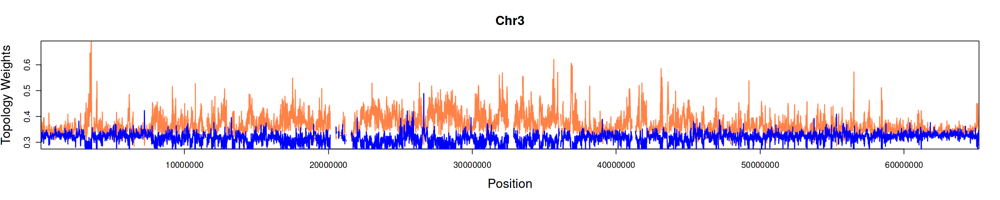

In [76]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr3
plot(wt1_win~windowMid, twisst3_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr3',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst3_wins, col='blue', lwd=1.5)

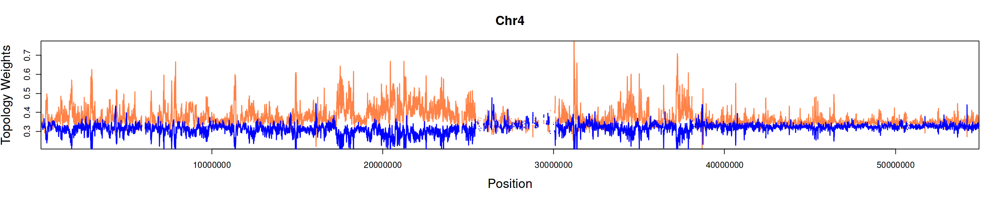

In [75]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr4
plot(wt1_win~windowMid, twisst4_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr4',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst4_wins, col='blue', lwd=1.5)

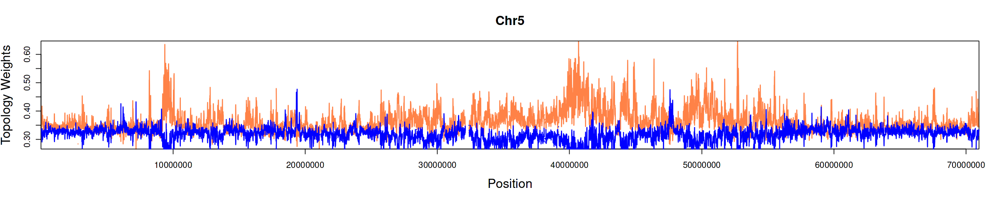

In [74]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr5
plot(wt1_win~windowMid, twisst5_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr5',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst5_wins, col='blue', lwd=1.5)

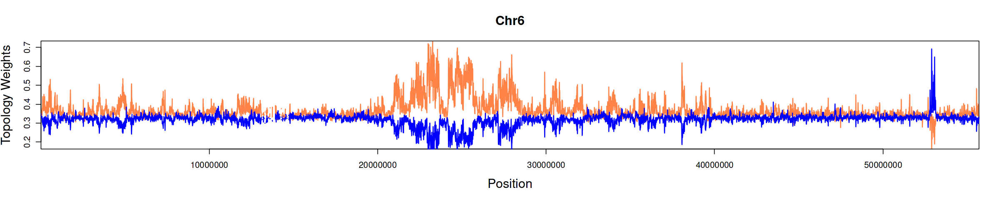

In [73]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr6
plot(wt1_win~windowMid, twisst6_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr6',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst6_wins, col='blue', lwd=1.5)

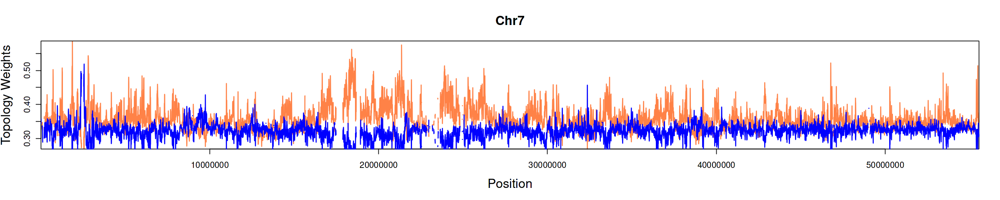

In [72]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr7
plot(wt1_win~windowMid, twisst7_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr7',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst7_wins, col='blue', lwd=1.5)

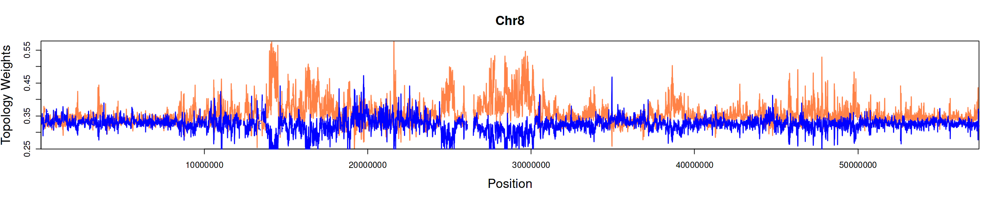

In [71]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,1), cex.lab=1.5, cex.main=1.5)

## Chr8
plot(wt1_win~windowMid, twisst8_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chr8',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst8_wins, col='blue', lwd=1.5)

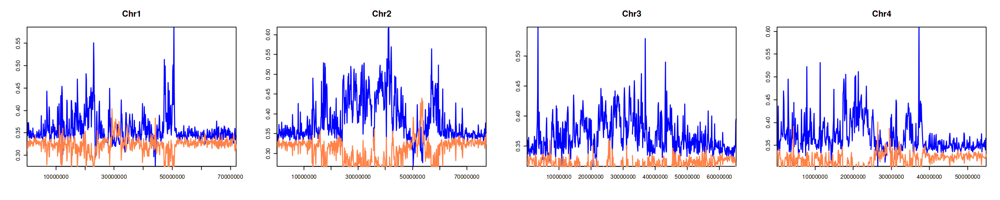

In [88]:
options(repr.plot.height=4, repr.plot.width=20)
par(xaxs='i', yaxs='i', mfrow=c(1,4), cex.lab=1.5, cex.main=1.5)

## Chr1
plot(wt1_win~windowMid, twisst1_wins2, type='l', col='blue', #ylim=c(0.2,0.8),
     main='Chr1',ylab='',xlab='', lwd=1.5)
lines(wt2_win~windowMid, twisst1_wins2, col='sienna1', lwd=1.5)
## Chr2
plot(wt1_win~windowMid, twisst2_wins2, type='l', col='blue', #ylim=c(0.2,0.8),
     main='Chr2',ylab='',xlab='', lwd=1.5)
lines(wt2_win~windowMid, twisst2_wins2, col='sienna1', lwd=1.5)
## Chr3
plot(wt1_win~windowMid, twisst3_wins2, type='l', col='blue', #ylim=c(0.2,0.8),
     main='Chr3',ylab='',xlab='', lwd=1.5)
lines(wt2_win~windowMid, twisst3_wins2, col='sienna1', lwd=1.5)
## Chr4
plot(wt1_win~windowMid, twisst4_wins2, type='l', col='blue', #ylim=c(0.2,0.8),
     main='Chr4',ylab='',xlab='', lwd=1.5)
lines(wt2_win~windowMid, twisst4_wins2, col='sienna1', lwd=1.5)

# ## Chr8
# plot(wt1_win~windowMid, twisst6_wins2, type='l', col='blue', #ylim=c(0.2,0.8),
#      main='Chr8',ylab='',xlab='', lwd=1.5)
# lines(wt2_win~windowMid, twisst6_wins2, col='sienna1', lwd=1.5)

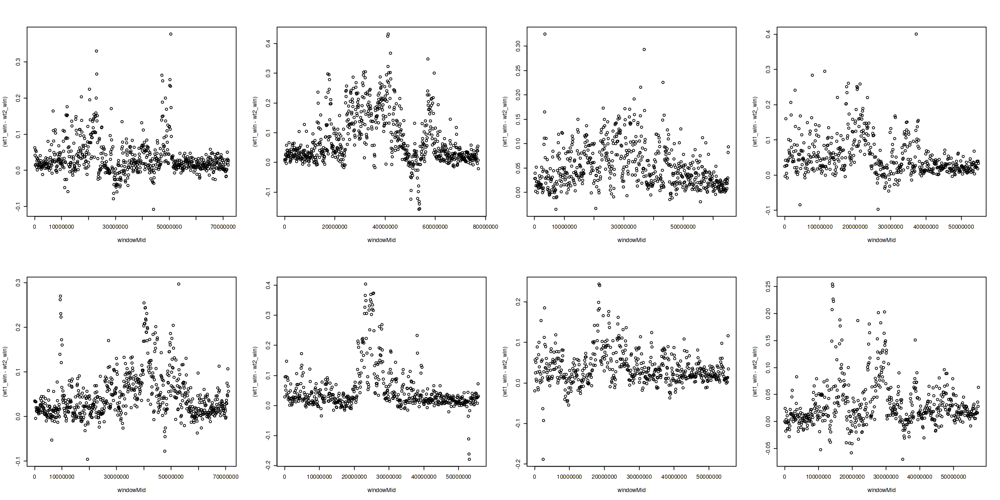

In [93]:
options(repr.plot.width=20, repr.plot.height=10)
par(mfrow=c(2,4))
plot((wt1_win-wt2_win)~windowMid, twisst1_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst2_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst3_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst4_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst5_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst6_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst7_wins2, cex=0.8)
plot((wt1_win-wt2_win)~windowMid, twisst8_wins2, cex=0.8)

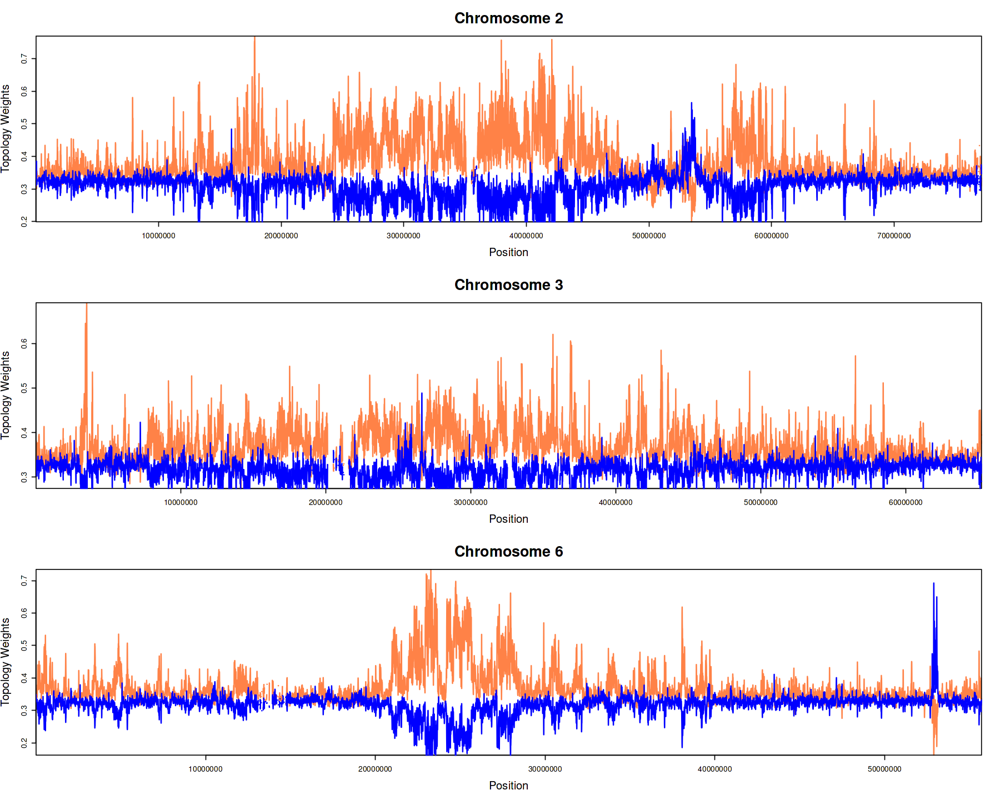

In [103]:
options(repr.plot.height=12, repr.plot.width=15)
par(xaxs='i', yaxs='i', mfrow=c(3,1), cex.lab=1.5, cex.main=2)

## Chr2
plot(wt1_win~windowMid, twisst2_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chromosome 2',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst2_wins, col='blue', lwd=1.5)

## Chr3
plot(wt1_win~windowMid, twisst3_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chromosome 3',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst3_wins, col='blue', lwd=1.5)

## Chr6
plot(wt1_win~windowMid, twisst6_wins, type='l', col='sienna1', #ylim=c(0.2,0.8),
     main='Chromosome 6',ylab='Topology Weights',xlab='Position', lwd=1.5)
lines(wt2_win~windowMid, twisst6_wins, col='blue', lwd=1.5)